In [1]:
import pandas as pd

In [2]:
# Load the  dataset
file_path = "/content/drive/MyDrive/Colab Notebooks/all_month.csv"
data = pd.read_csv(file_path)

In [3]:

# Check basic information about the dataset
print("Dataset Shape:", data.shape)
print("Dataset Info:")
data.info()

Dataset Shape: (9064, 22)
Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9064 entries, 0 to 9063
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             9064 non-null   object 
 1   latitude         9064 non-null   float64
 2   longitude        9064 non-null   float64
 3   depth            9064 non-null   float64
 4   mag              9064 non-null   float64
 5   magType          9064 non-null   object 
 6   nst              7590 non-null   float64
 7   gap              7590 non-null   float64
 8   dmin             7588 non-null   float64
 9   rms              9062 non-null   float64
 10  net              9064 non-null   object 
 11  id               9064 non-null   object 
 12  updated          9064 non-null   object 
 13  place            9064 non-null   object 
 14  type             9064 non-null   object 
 15  horizontalError  6642 non-null   float64
 16  depthError       906

Missing value

In [4]:
# Check for missing values
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100

# Display missing values
missing_data = pd.DataFrame({
    "Missing Values": missing_values,
    "Percentage (%)": missing_percentage
}).sort_values(by="Missing Values", ascending=False)

print("Missing Values Summary:")
print(missing_data[missing_data["Missing Values"] > 0])


Missing Values Summary:
                 Missing Values  Percentage (%)
horizontalError            2422       26.721094
magError                   1495       16.493822
magNst                     1477       16.295234
dmin                       1476       16.284201
nst                        1474       16.262136
gap                        1474       16.262136
rms                           2        0.022065
depthError                    1        0.011033


Handling missing value

In [5]:
# Handle missing values (updated to avoid inplace=True)
for col in data.columns:
    if data[col].dtype in ['float64', 'int64']:
        data[col] = data[col].fillna(data[col].mean())  # Replace NaNs with mean (or median for skewed data)
    elif data[col].dtype == 'object':
        data[col] = data[col].fillna(data[col].mode()[0])  # Replace NaNs with the most frequent value (mode)

# Verify no missing values remain
print("Missing Values After Handling:")
print(data.isnull().sum().sum())  # Should output 0


Missing Values After Handling:
0


Target Variable

In [6]:
# Inspect target variable (replace 'mag' with your actual target column name)
target_column = "mag"
print("Target Variable Unique Values:")
print(data[target_column].unique())

# Check if it's continuous or categorical
print("Target Variable Description:")
print(data[target_column].describe())


Target Variable Unique Values:
[ 1.39        2.42        0.48        2.3         1.66        1.3
  0.77        4.8         4.3         1.33        1.62        0.98
  1.68        1.74        1.2         1.4         1.          4.5
  1.26        1.03        2.01        4.2         1.6         4.1
  1.5         0.82        1.8         1.32        0.6         5.7
  1.09        2.4         1.96        4.4         1.36        2.58
  1.85        1.42        1.41        3.          2.44        4.7
  1.56        1.31        0.2         2.1         4.9         2.55
  0.9         2.05        5.          0.05        1.7         2.
  0.44        1.24        2.43        1.58        1.69        0.74
  0.39        0.08        2.74        0.1        -0.3         1.27
  1.04        3.02        1.1         0.86       -0.39       -0.42
  1.06        2.7         0.65        5.1         1.25        0.49
  2.23        1.71        0.97        1.53        2.03        1.23
 -0.95        0.35        0.42        

Feature Engineering

In [7]:
# Example: Extract date/time components (if 'time' is in datetime format)
data['time'] = pd.to_datetime(data['time'], errors='coerce')
data['year'] = data['time'].dt.year
data['month'] = data['time'].dt.month
data['day'] = data['time'].dt.day
data['hour'] = data['time'].dt.hour

# Drop 'time' column if no longer needed
data.drop(columns=['time'], inplace=True)


Encode Categorical Variables

In [8]:
from sklearn.preprocessing import LabelEncoder

# Encode categorical columns
categorical_cols = data.select_dtypes(include=['object']).columns
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

print("Categorical Encoding Complete.")


Categorical Encoding Complete.


Feature Scaling

In [9]:
from sklearn.preprocessing import StandardScaler

# Scale numerical features
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
scaler = StandardScaler()
data[numerical_cols] = scaler.fit_transform(data[numerical_cols])

print("Feature Scaling Complete.")


Feature Scaling Complete.


Split the Data

In [10]:
from sklearn.model_selection import train_test_split

# Define features (X) and target (y)
X = data.drop(columns=[target_column])
y = data[target_column]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Training and Testing Data Split Complete.")


Training and Testing Data Split Complete.


Evaluate model before balancing datset

Evalauation Metrices

XGBoost

In [11]:
from xgboost import XGBRegressor

# Train the model
xgb_reg = XGBRegressor(random_state=42)
xgb_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_xgb = xgb_reg.predict(X_test)

# Regression Metrics (adjust as needed)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse = mean_squared_error(y_test, y_pred_xgb)
mae = mean_absolute_error(y_test, y_pred_xgb)
r2 = r2_score(y_test, y_pred_xgb)

print("XGBoost Regression Metrics:")
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R2 Score: {r2}")


XGBoost Regression Metrics:
Mean Squared Error: 0.06342816899597212
Mean Absolute Error: 0.18089126726263344
R2 Score: 0.9358232160243924


Random Forest Regressor

In [12]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Train Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_rf = rf_model.predict(X_test)

# Evaluate Metrics
mse_rf = mean_squared_error(y_test, y_pred_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print("Random Forest Regressor Metrics:")
print(f"Mean Squared Error: {mse_rf}")
print(f"Mean Absolute Error: {mae_rf}")
print(f"R2 Score: {r2_rf}")


Random Forest Regressor Metrics:
Mean Squared Error: 0.06333186950431524
Mean Absolute Error: 0.17551497605153016
R2 Score: 0.9359206520968955


GBM

In [13]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Initialize the Gradient Boosting Regressor
gbm_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model on your training data
gbm_model.fit(X_train, y_train)

# Predict on the test set
y_pred_gbm = gbm_model.predict(X_test)

# Calculate and print evaluation metrics
mse_gbm = mean_squared_error(y_test, y_pred_gbm)
mae_gbm = mean_absolute_error(y_test, y_pred_gbm)
r2_gbm = r2_score(y_test, y_pred_gbm)

print("Gradient Boosting Regressor Metrics:")
print(f"Mean Squared Error: {mse_gbm}")
print(f"Mean Absolute Error: {mae_gbm}")
print(f"R2 Score: {r2_gbm}")


Gradient Boosting Regressor Metrics:
Mean Squared Error: 0.08608686257622043
Mean Absolute Error: 0.21535105298861631
R2 Score: 0.9128970917788475


Decision Trees

In [14]:
from sklearn.tree import DecisionTreeRegressor

# Train Decision Tree Regressor
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_dt = dt_model.predict(X_test)

# Evaluate Metrics
mse_dt = mean_squared_error(y_test, y_pred_dt)
mae_dt = mean_absolute_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print("Decision Tree Regressor Metrics:")
print(f"Mean Squared Error: {mse_dt}")
print(f"Mean Absolute Error: {mae_dt}")
print(f"R2 Score: {r2_dt}")


Decision Tree Regressor Metrics:
Mean Squared Error: 0.13105018973921811
Mean Absolute Error: 0.2481461262808076
R2 Score: 0.8674030821007892


Result comparison graph

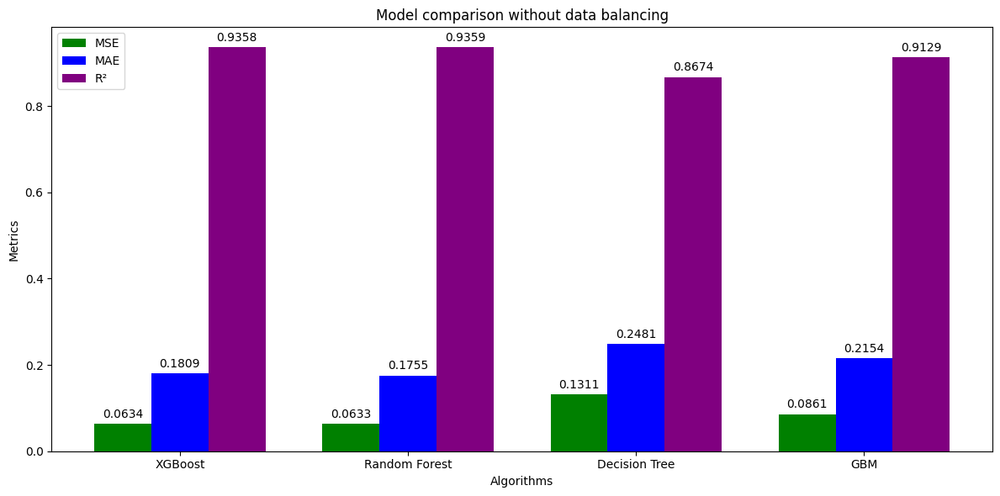

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# Define metrics for each algorithm
metrics = {
    "XGBoost": {"MSE": 0.06342816899597212, "MAE": 0.18089126726263344, "R2": 0.9358232160243924},
    "Random Forest": {"MSE": 0.06333186950431524, "MAE": 0.17551497605153016, "R2": 0.9359206520968955},
    "Decision Tree": {"MSE": 0.13105018973921811, "MAE": 0.2481461262808076, "R2": 0.8674030821007892},
    "GBM": {"MSE": 0.08608686257622043, "MAE": 0.21535105298861631, "R2": 0.9128970917788475}
}

algorithms = list(metrics.keys())
mse_values = [metrics[algo]["MSE"] for algo in algorithms]
mae_values = [metrics[algo]["MAE"] for algo in algorithms]
r2_values = [metrics[algo]["R2"] for algo in algorithms]

# Define bar positions
x = np.arange(len(algorithms))  # the label locations
width = 0.25  # the width of the bars

# Create a grouped bar chart
fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width, mse_values, width, label="MSE", color="green")
rects2 = ax.bar(x, mae_values, width, label="MAE", color="blue")
rects3 = ax.bar(x + width, r2_values, width, label="R²", color="purple")

# Add labels, title, and legend
ax.set_xlabel("Algorithms")
ax.set_ylabel("Metrics")
ax.set_title("Model comparison without data balancing")
ax.set_xticks(x)
ax.set_xticklabels(algorithms)
ax.legend()

# Add values on top of the bars for better readability
for rect in [rects1, rects2, rects3]:
    for bar in rect:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

plt.tight_layout()
plt.show()  # Display the plot


Apply cross validation and evaluate model

In [16]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
import numpy as np

# Ensure X and y are NumPy arrays
X = X.values if hasattr(X, 'values') else X
y = y.values if hasattr(y, 'values') else y

# Define models
models = {
    "XGBoost": XGBRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "Decision Tree": DecisionTreeRegressor(random_state=42)
}

# Cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_results = {}

for name, model in models.items():
    mse_list, mae_list, r2_list = [], [], []
    for train_idx, test_idx in cv.split(X, y):
        # Use indices to split NumPy arrays
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Train and predict
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Collect metrics
        mse_list.append(mean_squared_error(y_test, y_pred))
        mae_list.append(mean_absolute_error(y_test, y_pred))
        r2_list.append(r2_score(y_test, y_pred))

    # Store mean results only
    cv_results[name] = {
        "MSE": np.mean(mse_list),
        "MAE": np.mean(mae_list),
        "R²": np.mean(r2_list)
    }

# Display results without ±
for model_name, result in cv_results.items():
    print(f"\n{model_name}:")
    for metric, value in result.items():
        print(f"  {metric}: {value:.4f}")



XGBoost:
  MSE: 0.0650
  MAE: 0.1833
  R²: 0.9349

Random Forest:
  MSE: 0.0645
  MAE: 0.1781
  R²: 0.9355

Gradient Boosting:
  MSE: 0.0860
  MAE: 0.2148
  R²: 0.9139

Decision Tree:
  MSE: 0.1291
  MAE: 0.2526
  R²: 0.8707


Train-Test Split

In [17]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train and evaluate models
evaluation_results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Collect metrics
    evaluation_results[name] = {
        "MSE": mean_squared_error(y_test, y_pred),
        "MAE": mean_absolute_error(y_test, y_pred),
        "R²": r2_score(y_test, y_pred)
    }

# Display results
for model_name, result in evaluation_results.items():
    print(f"\n{model_name}:")
    for metric, value in result.items():
        print(f"  {metric}: {value:.4f}")



XGBoost:
  MSE: 0.0634
  MAE: 0.1809
  R²: 0.9358

Random Forest:
  MSE: 0.0633
  MAE: 0.1755
  R²: 0.9359

Gradient Boosting:
  MSE: 0.0861
  MAE: 0.2154
  R²: 0.9129

Decision Tree:
  MSE: 0.1311
  MAE: 0.2481
  R²: 0.8674


Apply SMOTE for balancing dataset

In [18]:
pip install smote-variants


  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.8/417.8 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 4.8 MB/s eta 0:00:00
  Created wheel for minisom: filename=MiniSom-2.3.3-py3-none-any.whl size=11706 sha256=120fb81d40db0aeb4475c97c66b589c99a204e91ba6a63bc7bcae66fac4db79b
  Stored in directory: /root/.cache/pip/wheels/c8/29/ba/ee521d9a6af783a1e1efb1831fe4afdf526613849b3f58175b
  Created wheel for statistics: filename=statistics-1.0.3.5-py3-none-any.whl size=7435 sha256=79ee84242adaa00fe3b7d657adc2a0457269848d710a6df61e4b1bc6d5ccea82
  Stored in directory: /root/.cache/pip/wheels/a7/30/34/fceae1c718a4e749dd51f479c5720c0671519887e824915e90
Successfully built minisom statistics


In [19]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import smote_variants as sv

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE for regression
oversampler = sv.distance_SMOTE(random_state=42)
X_train_resampled, y_train_resampled = oversampler.sample(X_train_scaled, y_train)

# Print resampled dataset shape
print(f"Resampled dataset shape: {X_train_resampled.shape}, {y_train_resampled.shape}")


2025-01-22 03:30:09,323:INFO:distance_SMOTE: Running sampling via ('distance_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': 42, 'class_name': 'distance_SMOTE'}")
INFO:smote_variants:distance_SMOTE: Running sampling via ('distance_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': 42, 'class_name': 'distance_SMOTE'}")
2025-01-22 03:30:09,329:INFO:distance_SMOTE: Too few minority samples for sampling
INFO:smote_variants:distance_SMOTE: Too few minority samples for sampling


Resampled dataset shape: (7251, 24), (7251,)


Model Evaluation after balancing data

In [20]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Train and evaluate models after SMOTE
evaluation_results_after_smote = {}
for name, model in models.items():
    # Train the model on SMOTE-resampled data
    model.fit(X_train_resampled, y_train_resampled)

    # Predict on the original test set
    y_pred = model.predict(X_test_scaled)

    # Collect metrics
    evaluation_results_after_smote[name] = {
        "MSE": mean_squared_error(y_test, y_pred),
        "MAE": mean_absolute_error(y_test, y_pred),
        "R²": r2_score(y_test, y_pred)
    }

# Display results
print("\nModel Evaluation Results After SMOTE:")
for model_name, result in evaluation_results_after_smote.items():
    print(f"\n{model_name}:")
    for metric, value in result.items():
        print(f"  {metric}: {value:.4f}")



Model Evaluation Results After SMOTE:

XGBoost:
  MSE: 0.0634
  MAE: 0.1806
  R²: 0.9358

Random Forest:
  MSE: 0.0632
  MAE: 0.1756
  R²: 0.9361

Gradient Boosting:
  MSE: 0.0861
  MAE: 0.2153
  R²: 0.9129

Decision Tree:
  MSE: 0.1308
  MAE: 0.2479
  R²: 0.8677


Feature selection

 Correlation Analysis

Evaluate model after correlation feature

In [21]:
# Correlation Analysis
correlation_threshold = 0.9
corr_matrix = pd.DataFrame(X_train_resampled).corr()

correlated_features = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > correlation_threshold:
            colname = corr_matrix.columns[i]
            correlated_features.add(colname)

# Drop correlated features
X_train_corr = pd.DataFrame(X_train_resampled).drop(columns=correlated_features, axis=1)
X_test_corr = pd.DataFrame(X_test_scaled).drop(columns=correlated_features, axis=1)

print(f"Features dropped due to correlation: {correlated_features}")
print(f"Remaining features after correlation analysis: {X_train_corr.shape[1]}")

# Evaluate Models After Correlation Analysis
print("\nEvaluating models after correlation-based feature selection:")
for name, model in models.items():
    model.fit(X_train_corr, y_train_resampled)
    y_pred = model.predict(X_test_corr)

    # Collect metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"\n{name} - After Correlation Analysis:")
    print(f"  MSE: {mse:.4f}")
    print(f"  MAE: {mae:.4f}")
    print(f"  R²: {r2:.4f}")


Features dropped due to correlation: {9, 18, 19, 21}
Remaining features after correlation analysis: 20

Evaluating models after correlation-based feature selection:

XGBoost - After Correlation Analysis:
  MSE: 0.0651
  MAE: 0.1837
  R²: 0.9341

Random Forest - After Correlation Analysis:
  MSE: 0.0634
  MAE: 0.1765
  R²: 0.9359

Gradient Boosting - After Correlation Analysis:
  MSE: 0.0834
  MAE: 0.2116
  R²: 0.9156

Decision Tree - After Correlation Analysis:
  MSE: 0.1362
  MAE: 0.2526
  R²: 0.8622


Confusion matrix after correlation


Generating Confusion Matrices for Correlation Analysis:


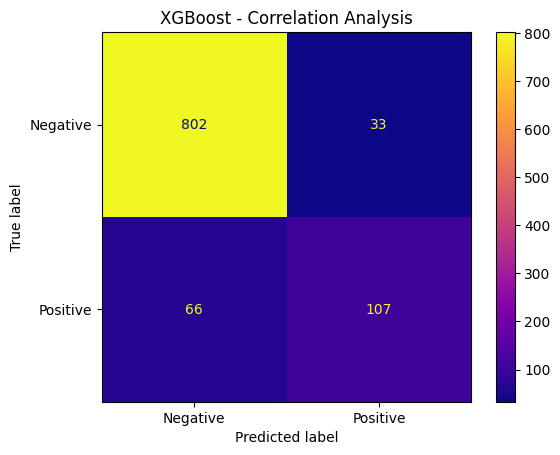

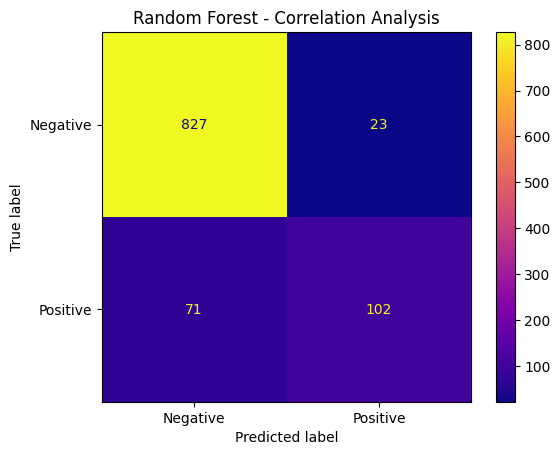

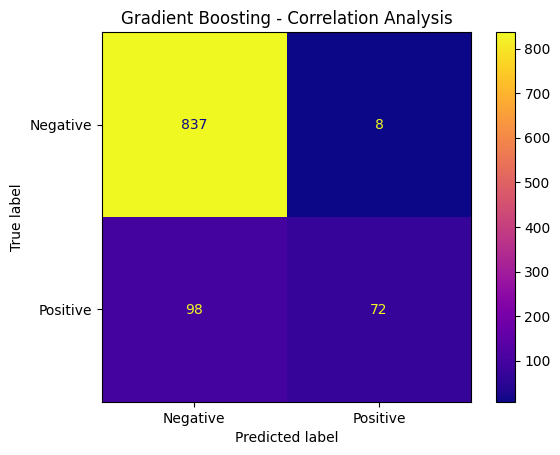

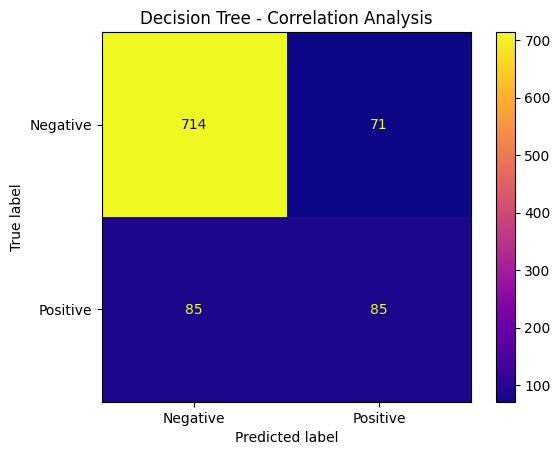

In [22]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Generate and plot confusion matrices for Correlation Analysis
print("\nGenerating Confusion Matrices for Correlation Analysis:")
for name, model in models.items():
    y_pred = model.predict(X_test_corr)  # Use predictions from correlation-based feature selection

    # Compute confusion matrix
    cm = confusion_matrix(np.round(y_test), np.round(y_pred), labels=[0, 1])

    # Plot the confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Negative", "Positive"])
    disp.plot(cmap=plt.cm.plasma, colorbar=True)  # Use a color scheme similar to the style
    plt.title(f"{name} - Correlation Analysis")
    plt.show()


ROC-AUC for Correlation Analysis

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import Binarizer

# Define normalization function
def normalize_predictions(predictions):
    """
    Normalize predictions to the range [0, 1].
    """
    min_pred = np.min(predictions)
    max_pred = np.max(predictions)
    return (predictions - min_pred) / (max_pred - min_pred)



Generating ROC-AUC curves for Correlation Analysis:


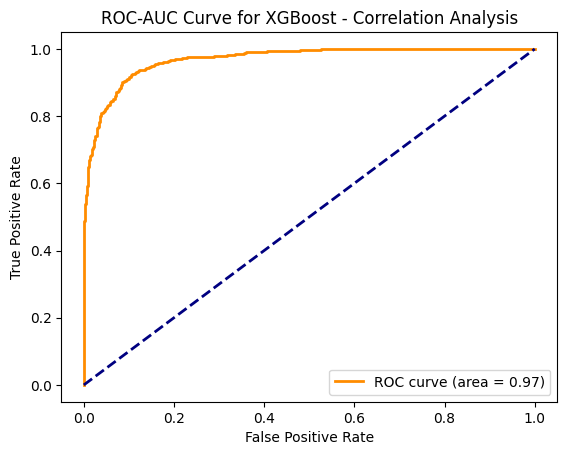

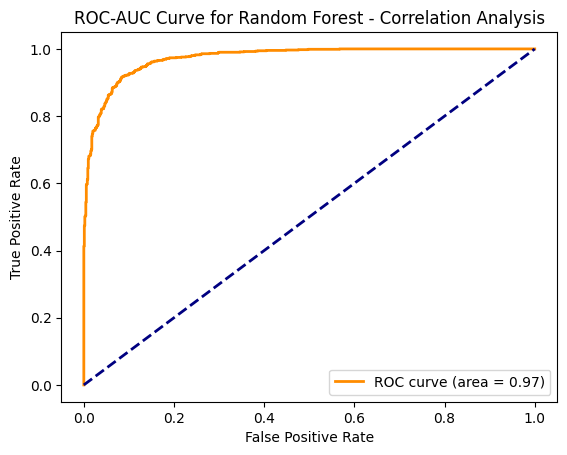

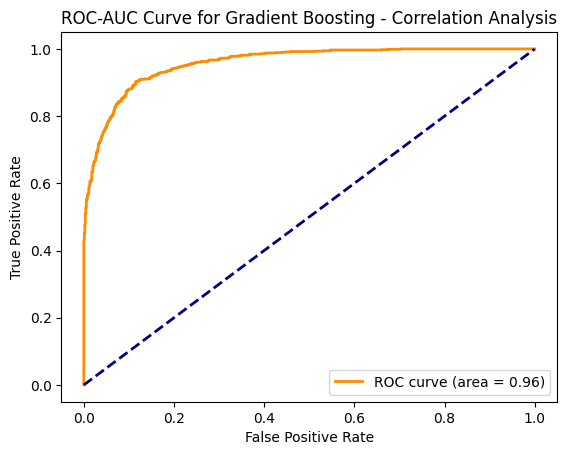

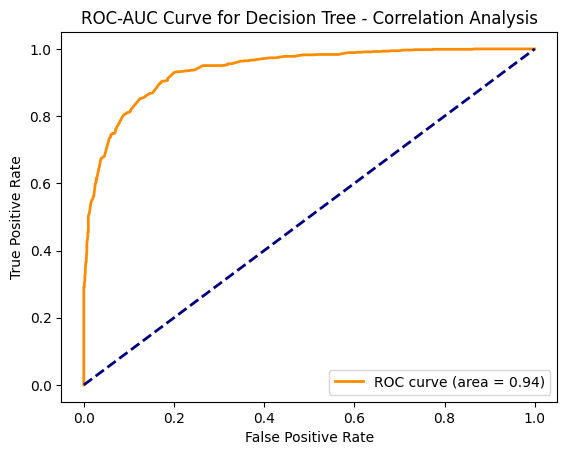

In [24]:
# Binarize the target for ROC-AUC
def binarize_target(y, threshold=None):
    if threshold is None:
        threshold = np.median(y)  # Default threshold is the median
    return (y >= threshold).astype(int)

# Ensure target is binarized for classification-like evaluation
y_test_binarized = binarize_target(y_test)  # Adjust `y_test` as required by your dataset

# ROC-AUC for Correlation Analysis
print("\nGenerating ROC-AUC curves for Correlation Analysis:")
for name, model in models.items():
    # Train the model with correlation-based features
    model.fit(X_train_corr, y_train)
    y_pred = model.predict(X_test_corr)

    # Normalize predictions to [0, 1]
    y_pred_normalized = normalize_predictions(y_pred)

    # Compute ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(y_test_binarized, y_pred_normalized)
    roc_auc = auc(fpr, tpr)

    # Plot ROC-AUC curve
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC-AUC Curve for {name} - Correlation Analysis')
    plt.legend(loc="lower right")
    plt.show()

 Recursive Feature Elimination (RFE)

In [25]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor

# Recursive Feature Elimination (RFE)
estimator = RandomForestRegressor(random_state=42)
rfe = RFE(estimator=estimator, n_features_to_select=10)
rfe.fit(X_train_corr, y_train_resampled)

# Select features
selected_features = rfe.support_
X_train_rfe = X_train_corr.loc[:, selected_features]
X_test_rfe = X_test_corr.loc[:, selected_features]

print(f"Features selected by RFE: {X_train_rfe.columns.tolist()}")
print(f"Remaining features after RFE: {X_train_rfe.shape[1]}")

# Evaluate Models After RFE
print("\nEvaluating models after RFE-based feature selection:")
for name, model in models.items():
    model.fit(X_train_rfe, y_train_resampled)
    y_pred = model.predict(X_test_rfe)

    # Collect metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"\n{name} - After RFE:")
    print(f"  MSE: {mse:.4f}")
    print(f"  MAE: {mae:.4f}")
    print(f"  R²: {r2:.4f}")


Features selected by RFE: [0, 1, 2, 3, 4, 6, 7, 8, 13, 16]
Remaining features after RFE: 10

Evaluating models after RFE-based feature selection:

XGBoost - After RFE:
  MSE: 0.0707
  MAE: 0.1909
  R²: 0.9285

Random Forest - After RFE:
  MSE: 0.0668
  MAE: 0.1833
  R²: 0.9324

Gradient Boosting - After RFE:
  MSE: 0.0854
  MAE: 0.2141
  R²: 0.9136

Decision Tree - After RFE:
  MSE: 0.1343
  MAE: 0.2566
  R²: 0.8641


Confusion matrix after feature selection


Generating Confusion Matrices for RFE:


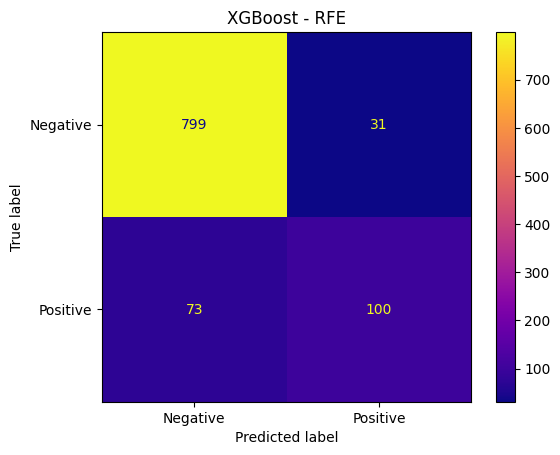

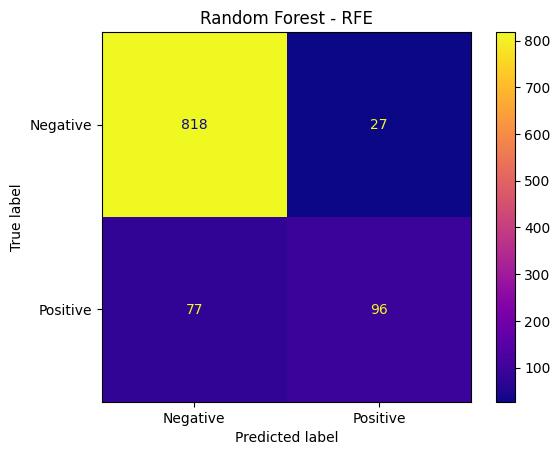

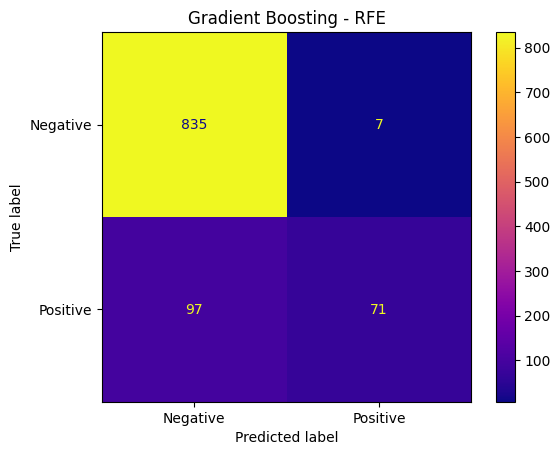

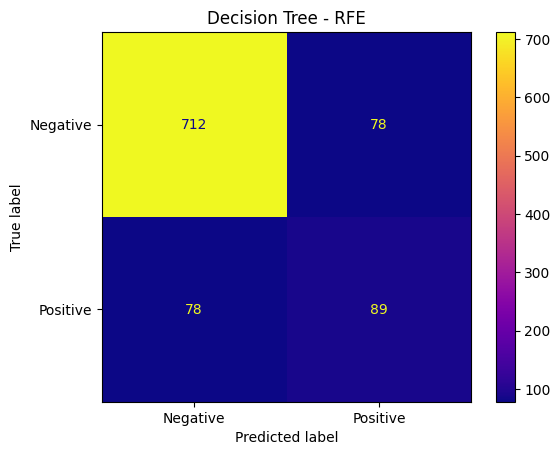

In [26]:
# Generate and plot confusion matrices for RFE
print("\nGenerating Confusion Matrices for RFE:")
for name, model in models.items():
    y_pred = model.predict(X_test_rfe)  # Use predictions from RFE-based feature selection

    # Compute confusion matrix
    cm = confusion_matrix(np.round(y_test), np.round(y_pred), labels=[0, 1])

    # Plot the confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Negative", "Positive"])
    disp.plot(cmap=plt.cm.plasma, colorbar=True)  # Use a color scheme similar to the style
    plt.title(f"{name} - RFE")
    plt.show()


 ROC-AUC for RFE


Generating ROC-AUC curves for RFE:


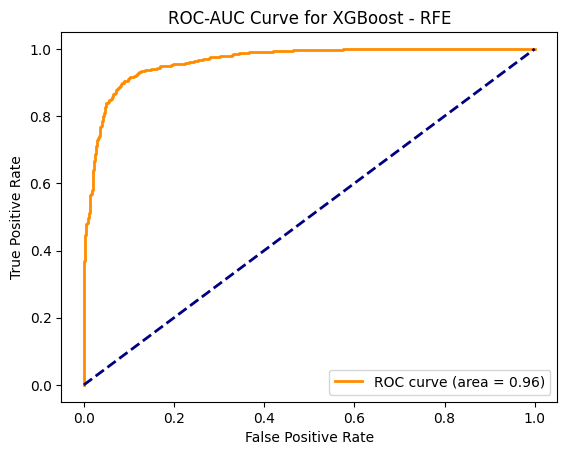

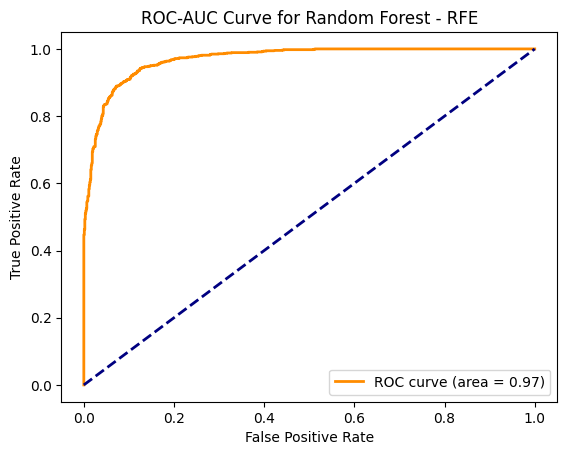

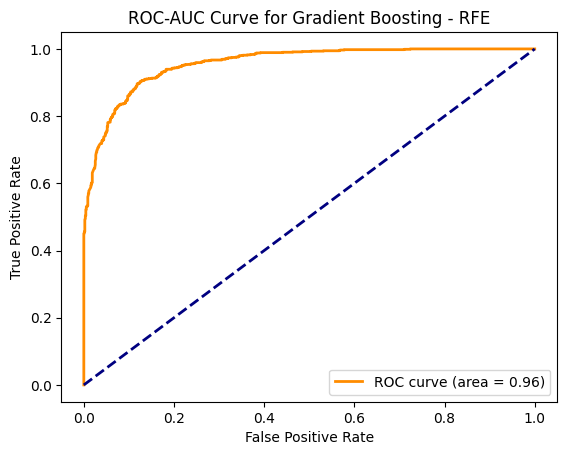

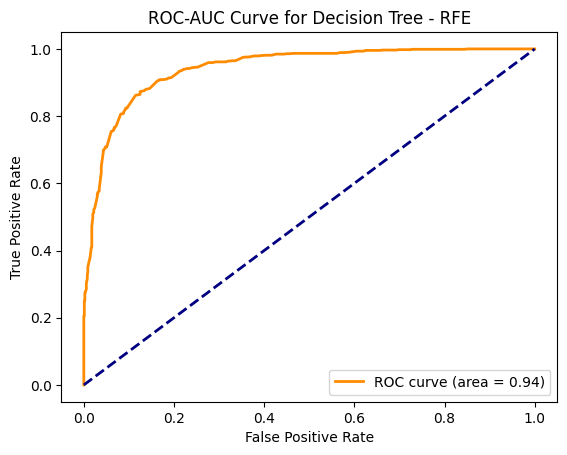

In [27]:
# ROC-AUC for RFE
print("\nGenerating ROC-AUC curves for RFE:")
for name, model in models.items():
    # Train the model with RFE-selected features
    model.fit(X_train_rfe, y_train)
    y_pred = model.predict(X_test_rfe)
    y_pred_normalized = normalize_predictions(y_pred)  # Normalize predictions to [0, 1]

    # Compute ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(y_test_binarized, y_pred_normalized)
    roc_auc = auc(fpr, tpr)

    # Plot ROC-AUC curve
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC-AUC Curve for {name} - RFE')
    plt.legend(loc="lower right")
    plt.show()


Apply SHAP and LIME

SHAP

In [28]:
!pip install shap



SHAP Analysis for Random Forest on Correlation Features:


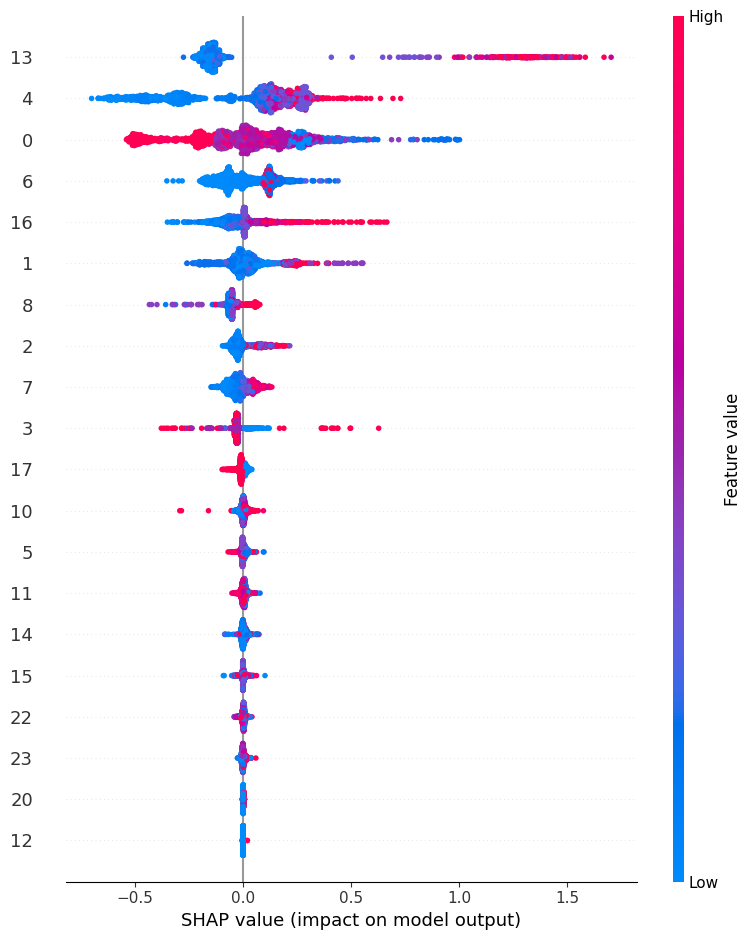


Local Explanation for the First Instance of Random Forest on Correlation Features:


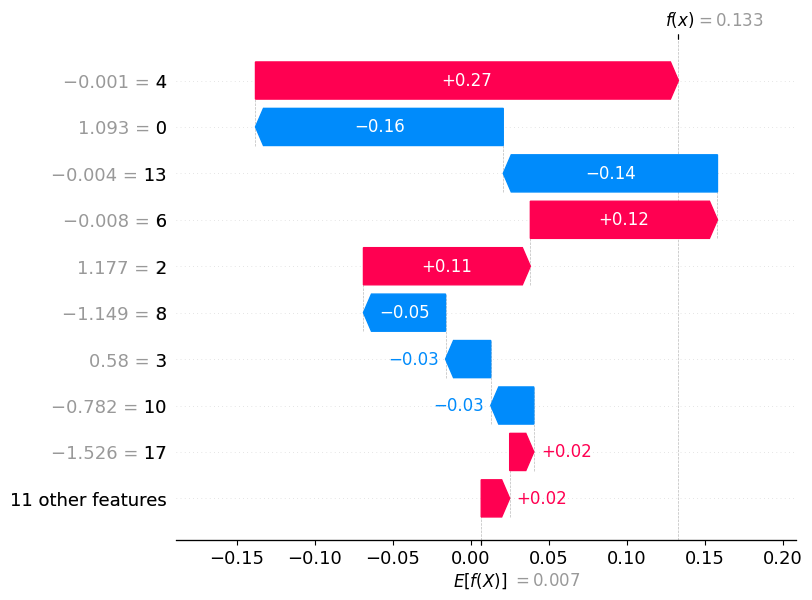


SHAP Analysis for Gradient Boosting on Correlation Features:


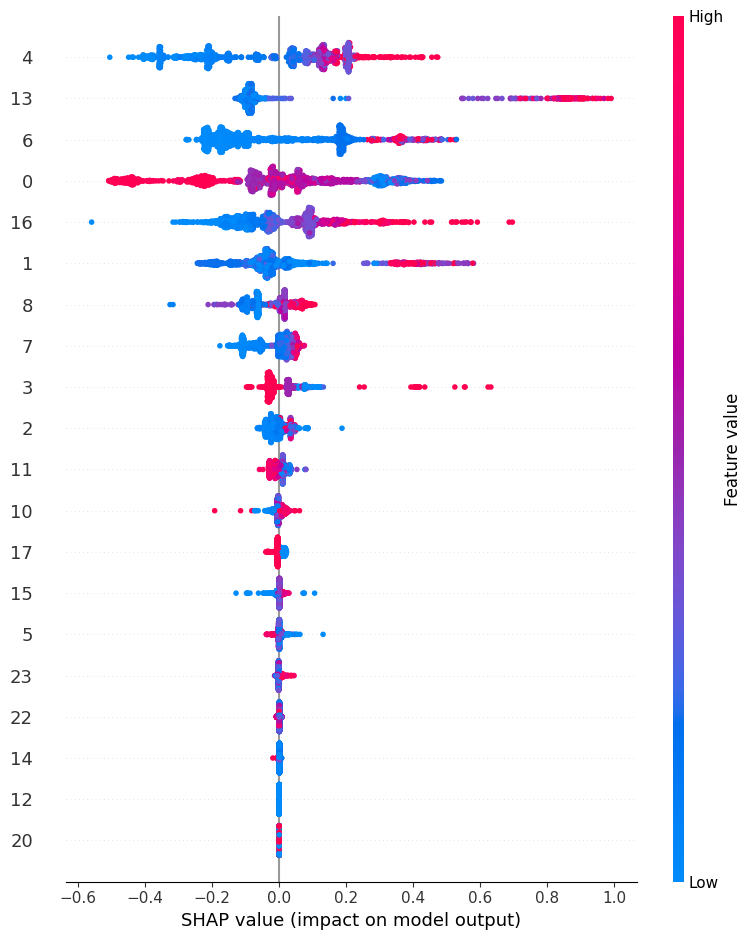


Local Explanation for the First Instance of Gradient Boosting on Correlation Features:


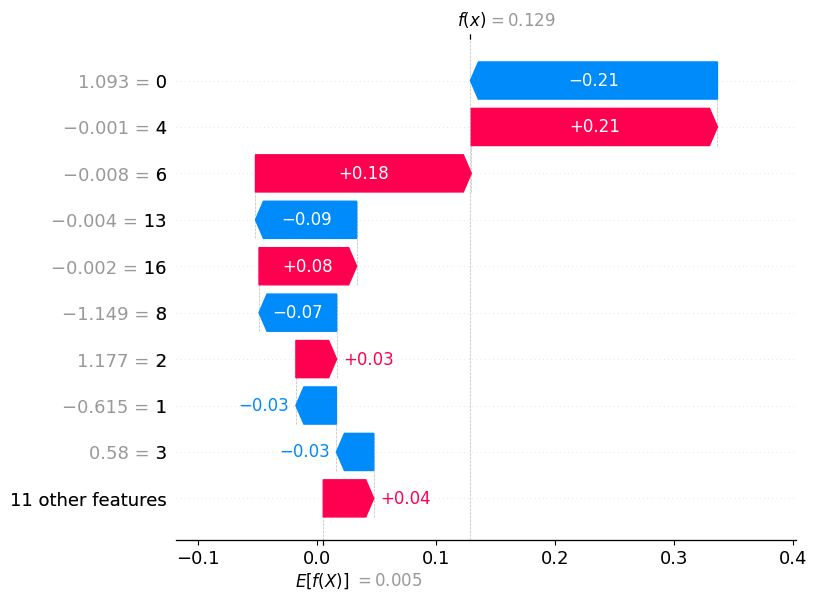


SHAP Analysis for Decision Tree on Correlation Features:


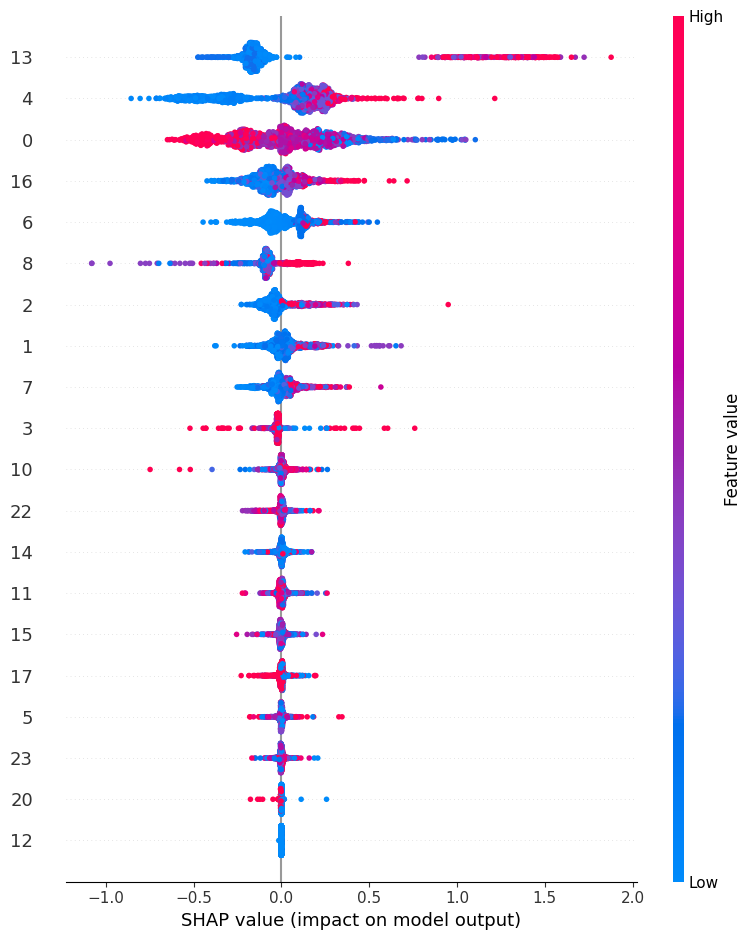


Local Explanation for the First Instance of Decision Tree on Correlation Features:


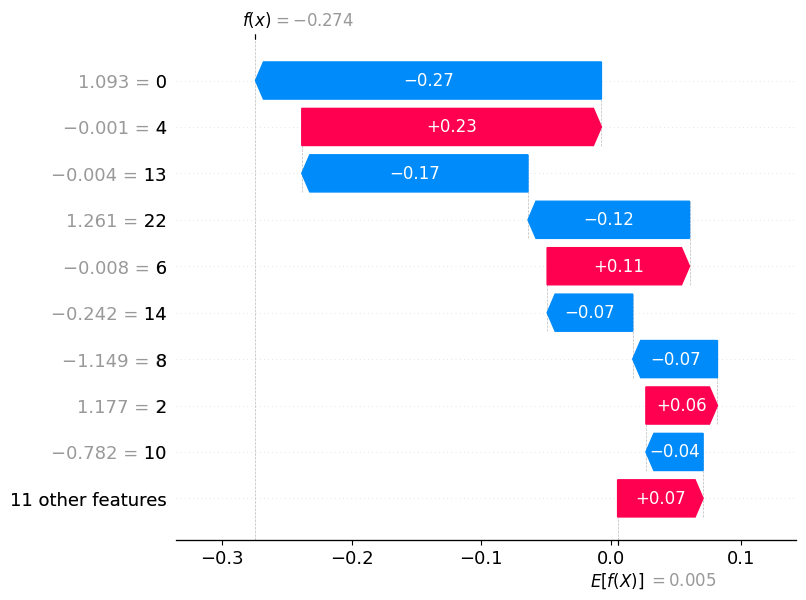


SHAP Analysis for XGBoost on Correlation Features:


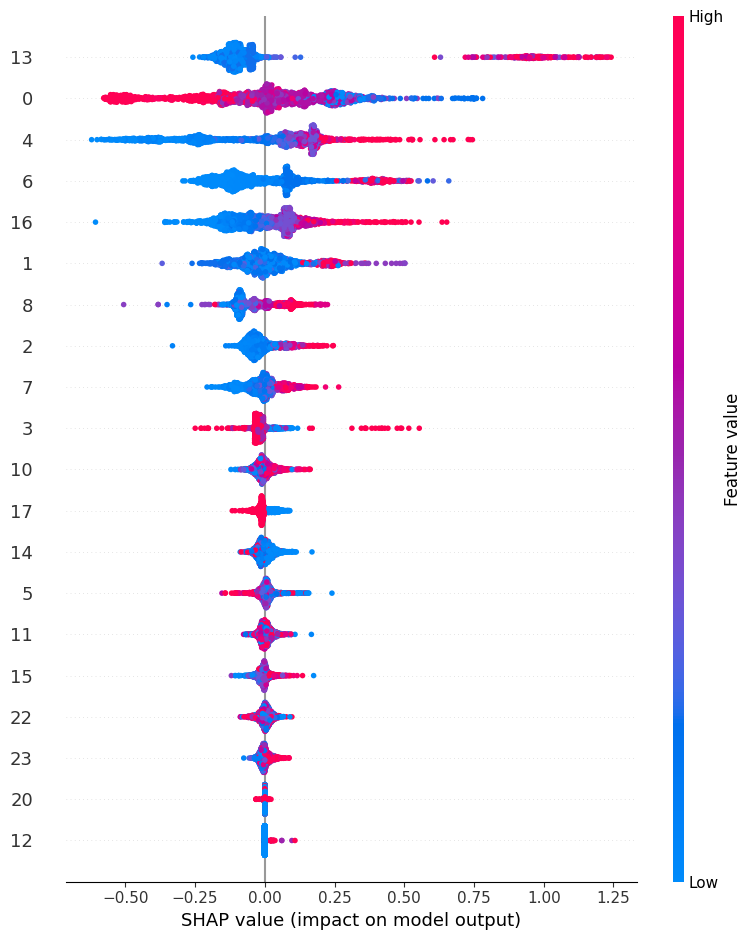


Local Explanation for the First Instance of XGBoost on Correlation Features:


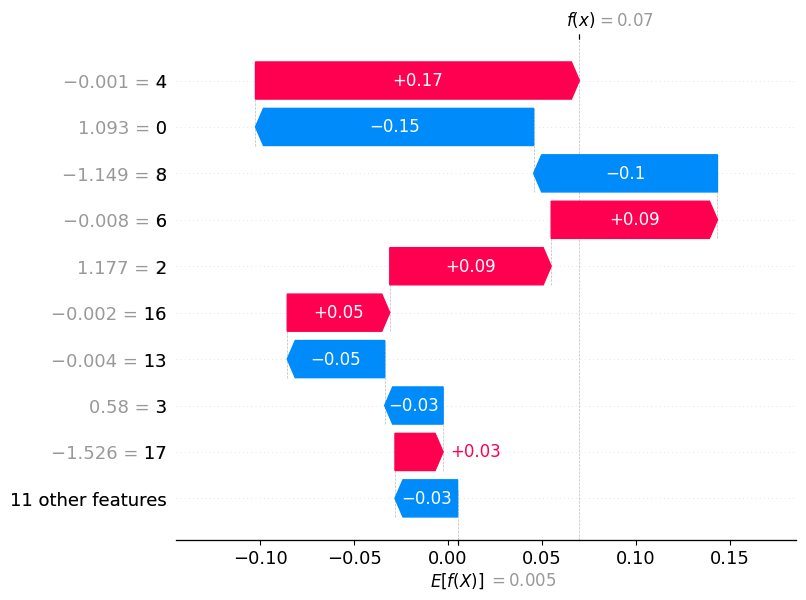


SHAP Analysis for Random Forest on RFE Features:


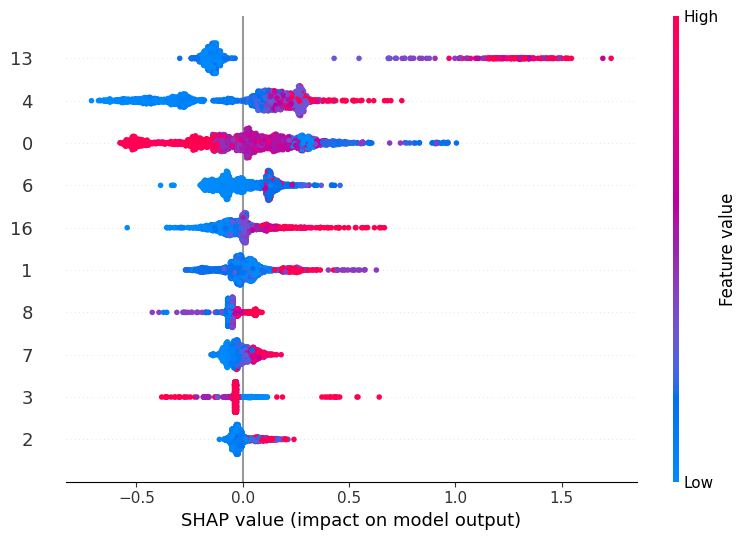


Local Explanation for the First Instance of Random Forest on RFE Features:


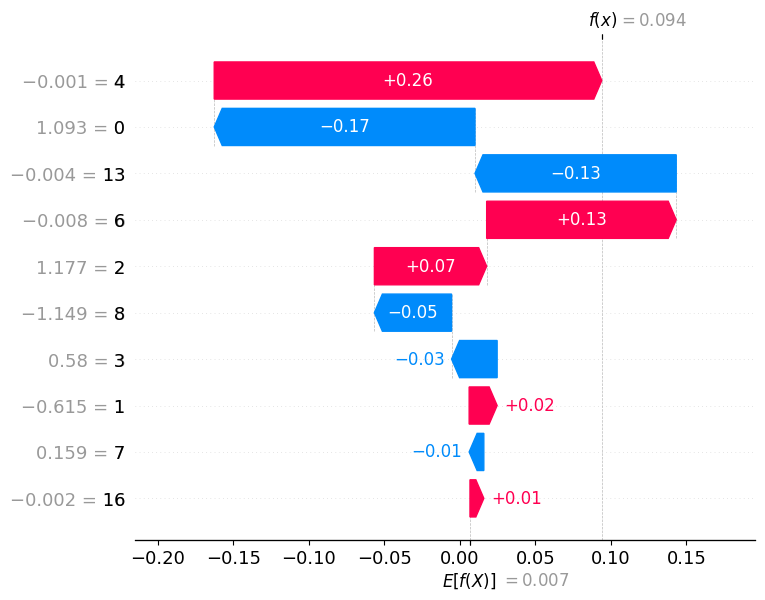


SHAP Analysis for Gradient Boosting on RFE Features:


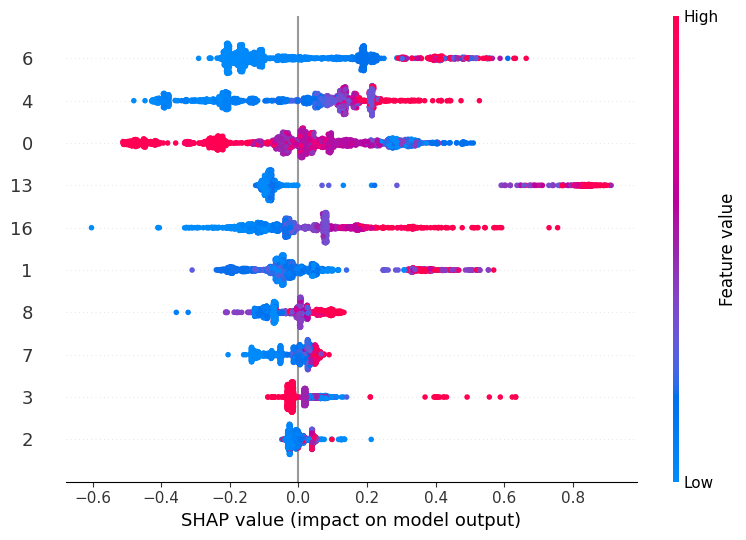


Local Explanation for the First Instance of Gradient Boosting on RFE Features:


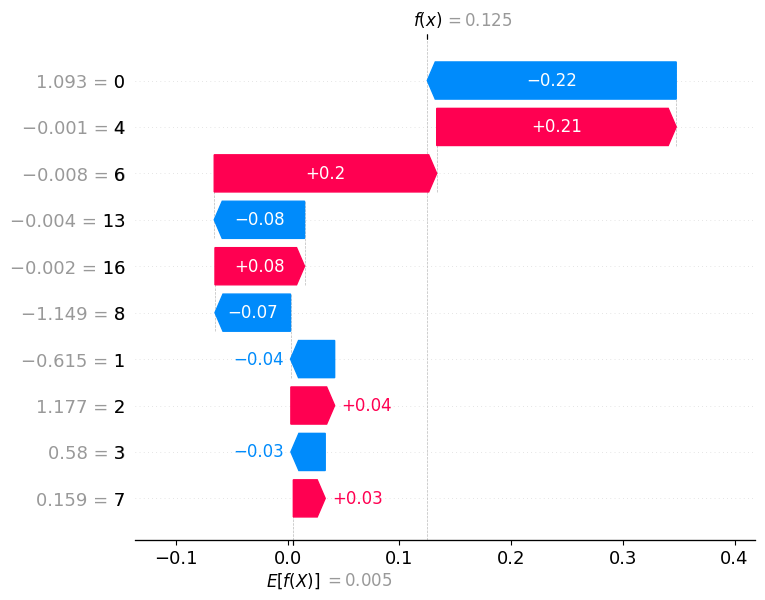


SHAP Analysis for Decision Tree on RFE Features:


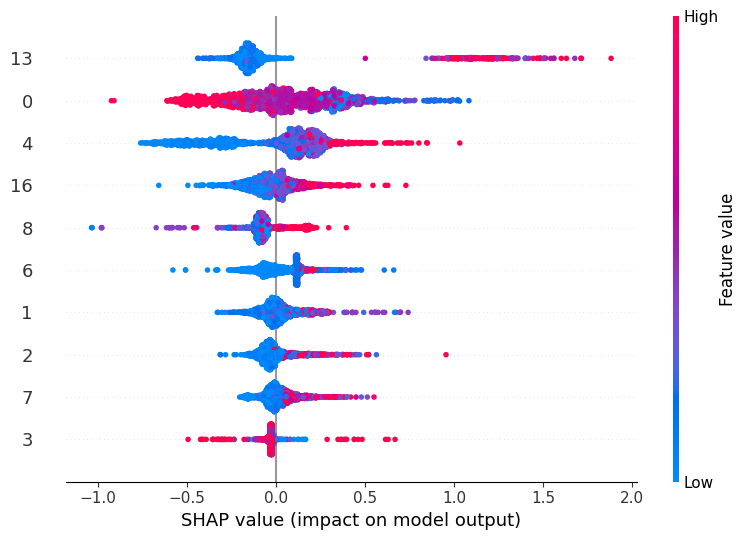


Local Explanation for the First Instance of Decision Tree on RFE Features:


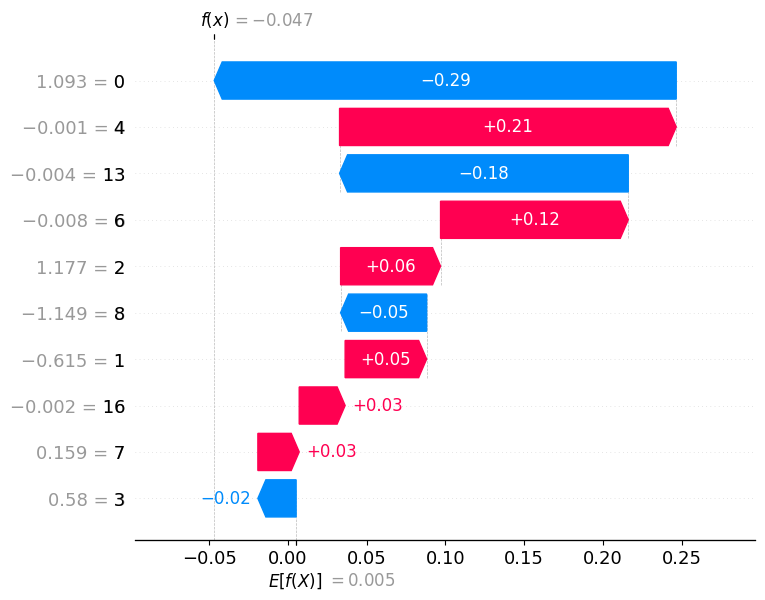


SHAP Analysis for XGBoost on RFE Features:


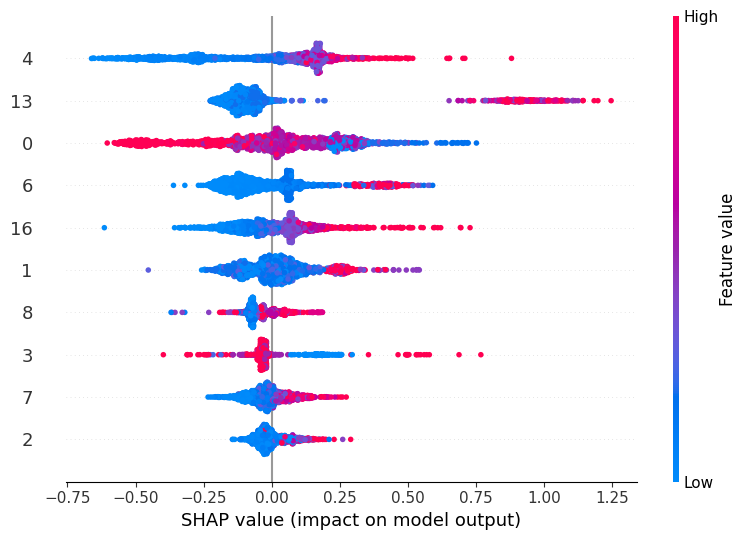


Local Explanation for the First Instance of XGBoost on RFE Features:


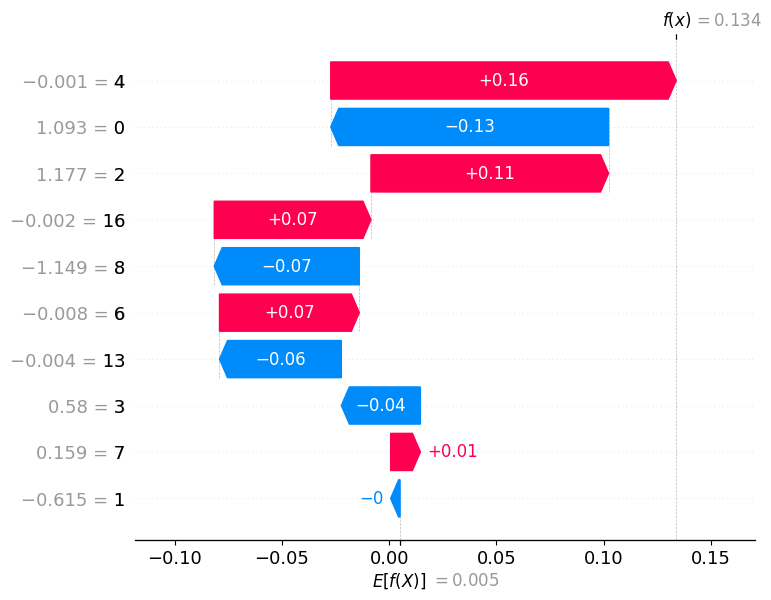

In [ ]:
import shap

# Define models
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42)
}

# Feature sets
feature_sets = {
    "Correlation Features": (X_train_corr, X_test_corr),
    "RFE Features": (X_train_rfe, X_test_rfe)
}

# Loop through feature sets and models
for feature_set_name, (X_train, X_test) in feature_sets.items():
    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train_resampled)

        # Use SHAP TreeExplainer
        explainer = shap.TreeExplainer(model)
        shap_values = explainer(X_test)

        # Global Feature Importance Plot
        print(f"\nSHAP Analysis for {model_name} on {feature_set_name}:")
        shap.summary_plot(shap_values, X_test)

        # Local Explanation for the First Instance
        print(f"\nLocal Explanation for the First Instance of {model_name} on {feature_set_name}:")
        instance_explanation = shap.Explanation(
            values=shap_values[0].values,
            base_values=shap_values[0].base_values,
            data=X_test.iloc[0].to_numpy(),
            feature_names=[str(col) for col in X_test.columns],  # Convert feature names to strings
        )
        shap.waterfall_plot(instance_explanation)


LIME

In [111]:
!pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=8bebce0e6b75767ff944d4c52910a9dd19cab1dec187951aa9afb764ce1b7473
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
from lime.lime_tabular import LimeTabularExplainer

# Loop through feature sets and models
for feature_set_name, (X_train, X_test) in feature_sets.items():
    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train_resampled)

        # LIME Analysis
        print(f"\nLIME Analysis for {model_name} on {feature_set_name}:")
        explainer = LimeTabularExplainer(
            X_train.values,
            mode="regression",
            feature_names=X_train.columns,
            training_labels=y_train_resampled,
            verbose=True
        )
        explanation = explainer.explain_instance(
            X_test.iloc[0].values,
            model.predict
        )
        explanation.show_in_notebook()



LIME Analysis for Random Forest on Correlation Features:
Intercept 0.1880681205880211
Prediction_local [0.12359298]
Right: 0.13314202143853013



LIME Analysis for Gradient Boosting on Correlation Features:
Intercept 0.1971027788234232
Prediction_local [-0.07303459]
Right: 0.12881091691865532



LIME Analysis for Decision Tree on Correlation Features:
Intercept 0.008503602900778173
Prediction_local [0.01805367]
Right: -0.2742019250749344



LIME Analysis for XGBoost on Correlation Features:
Intercept 0.3889238109776751
Prediction_local [0.16249762]
Right: 0.069906704



LIME Analysis for Random Forest on RFE Features:
Intercept 0.21214598344661664
Prediction_local [0.21434754]
Right: 0.09397579113399956



LIME Analysis for Gradient Boosting on RFE Features:
Intercept 0.27668383117934536
Prediction_local [0.01147681]
Right: 0.12497224711353706



LIME Analysis for Decision Tree on RFE Features:
Intercept 0.11922864265386363
Prediction_local [-0.14310654]
Right: -0.046931729884234406



LIME Analysis for XGBoost on RFE Features:
Intercept 0.4779985499065553
Prediction_local [0.18354818]
Right: 0.13374405


Stacking Ensemble

In [88]:
import warnings
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Suppress warnings
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=UserWarning)
    warnings.filterwarnings("ignore", category=FutureWarning)

    # Define base models for stacking
    base_models = [
        ('Random Forest', RandomForestRegressor(random_state=42)),
        ('Gradient Boosting', GradientBoostingRegressor(random_state=42)),
        ('Decision Tree', DecisionTreeRegressor(random_state=42))
    ]

    # Define the meta-model
    meta_model = Ridge(alpha=1.0)

    # Create the Stacking Regressor
    stacking_model = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5, n_jobs=-1)

    # Train and evaluate on Correlation Analysis features
    print("\nStacking Model Evaluation (Correlation Analysis):")
    stacking_model.fit(X_train_corr, y_train_resampled)
    y_pred_stacking_corr = stacking_model.predict(X_test_corr)

    # Metrics for Correlation Analysis
    mse_corr = mean_squared_error(y_test, y_pred_stacking_corr)
    mae_corr = mean_absolute_error(y_test, y_pred_stacking_corr)
    r2_corr = r2_score(y_test, y_pred_stacking_corr)

    print(f"MSE: {mse_corr:.4f}")
    print(f"MAE: {mae_corr:.4f}")
    print(f"R²: {r2_corr:.4f}")

    # Train and evaluate on RFE features
    print("\nStacking Model Evaluation (RFE):")
    stacking_model.fit(X_train_rfe, y_train_resampled)
    y_pred_stacking_rfe = stacking_model.predict(X_test_rfe)

    # Metrics for RFE
    mse_rfe = mean_squared_error(y_test, y_pred_stacking_rfe)
    mae_rfe = mean_absolute_error(y_test, y_pred_stacking_rfe)
    r2_rfe = r2_score(y_test, y_pred_stacking_rfe)

    print(f"MSE: {mse_rfe:.4f}")
    print(f"MAE: {mae_rfe:.4f}")
    print(f"R²: {r2_rfe:.4f}")



Stacking Model Evaluation (Correlation Analysis):
MSE: 0.0631
MAE: 0.1770
R²: 0.9361

Stacking Model Evaluation (RFE):
MSE: 0.0665
MAE: 0.1843
R²: 0.9327


 Soft Voting Ensemble

In [30]:
import numpy as np

# Define base models for soft voting
soft_voting_models = {
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'Decision Tree': DecisionTreeRegressor(random_state=42)
}

# Train and evaluate Soft Voting on Correlation Analysis features
print("\nSoft Voting Evaluation (Correlation Analysis):")
predictions_corr = []
for name, model in soft_voting_models.items():
    model.fit(X_train_corr, y_train_resampled)
    predictions_corr.append(model.predict(X_test_corr))

# Average predictions for soft voting
y_pred_soft_voting_corr = np.mean(predictions_corr, axis=0)

# Metrics for Correlation Analysis
mse_corr = mean_squared_error(y_test, y_pred_soft_voting_corr)
mae_corr = mean_absolute_error(y_test, y_pred_soft_voting_corr)
r2_corr = r2_score(y_test, y_pred_soft_voting_corr)

print(f"MSE: {mse_corr:.4f}")
print(f"MAE: {mae_corr:.4f}")
print(f"R²: {r2_corr:.4f}")

# Train and evaluate Soft Voting on RFE features
print("\nSoft Voting Evaluation (RFE):")
predictions_rfe = []
for name, model in soft_voting_models.items():
    model.fit(X_train_rfe, y_train_resampled)
    predictions_rfe.append(model.predict(X_test_rfe))

# Average predictions for soft voting
y_pred_soft_voting_rfe = np.mean(predictions_rfe, axis=0)

# Metrics for RFE
mse_rfe = mean_squared_error(y_test, y_pred_soft_voting_rfe)
mae_rfe = mean_absolute_error(y_test, y_pred_soft_voting_rfe)
r2_rfe = r2_score(y_test, y_pred_soft_voting_rfe)

print(f"MSE: {mse_rfe:.4f}")
print(f"MAE: {mae_rfe:.4f}")
print(f"R²: {r2_rfe:.4f}")



Soft Voting Evaluation (Correlation Analysis):
MSE: 0.0732
MAE: 0.1908
R²: 0.9259

Soft Voting Evaluation (RFE):
MSE: 0.0748
MAE: 0.1945
R²: 0.9243


Ensemble model comparison with Heatmap visualization

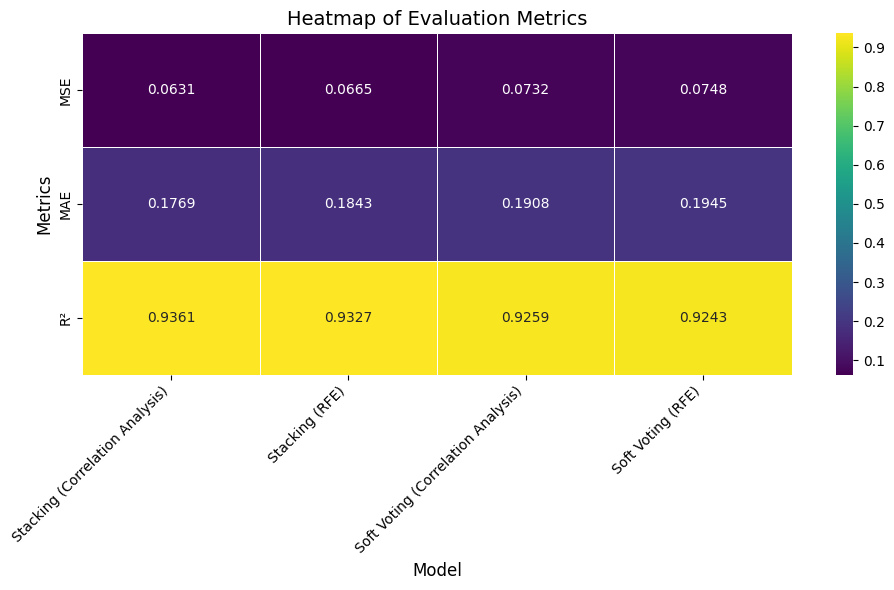

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Data for heatmap
data = {
    "Metric": ["MSE", "MAE", "R²"],
    "Stacking (Correlation Analysis)": [0.0631, 0.1769, 0.9361],
    "Stacking (RFE)": [0.0665, 0.1843, 0.9327],
    "Soft Voting (Correlation Analysis)": [0.0732, 0.1908, 0.9259],
    "Soft Voting (RFE)": [0.0748, 0.1945, 0.9243]
}

# Create a DataFrame
df = pd.DataFrame(data)
df.set_index("Metric", inplace=True)

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df, annot=True, fmt=".4f", cmap="viridis", cbar=True, linewidths=0.5)

# Title and labels
plt.title("Heatmap of Evaluation Metrics", fontsize=14)
plt.ylabel("Metrics", fontsize=12)
plt.xlabel("Model", fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()


Hybrid ensemble model

In [96]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Step 1: Combine stacking and soft voting predictions for hybrid model
# Correlation Analysis
hybrid_predictions_corr = np.mean(
    np.column_stack((y_pred_stacking_corr, y_pred_soft_voting_corr)), axis=1
)

# RFE
hybrid_predictions_rfe = np.mean(
    np.column_stack((y_pred_stacking_rfe, y_pred_soft_voting_rfe)), axis=1
)

# Step 2: Evaluate the hybrid ensemble model
# Metrics for Correlation Analysis
mse_hybrid_corr = mean_squared_error(y_test, hybrid_predictions_corr)
mae_hybrid_corr = mean_absolute_error(y_test, hybrid_predictions_corr)
r2_hybrid_corr = r2_score(y_test, hybrid_predictions_corr)

print("\nHybrid Model Evaluation (Correlation Analysis):")
print(f"MSE: {mse_hybrid_corr:.4f}")
print(f"MAE: {mae_hybrid_corr:.4f}")
print(f"R²: {r2_hybrid_corr:.4f}")

# Metrics for RFE
mse_hybrid_rfe = mean_squared_error(y_test, hybrid_predictions_rfe)
mae_hybrid_rfe = mean_absolute_error(y_test, hybrid_predictions_rfe)
r2_hybrid_rfe = r2_score(y_test, hybrid_predictions_rfe)

print("\nHybrid Model Evaluation (RFE):")
print(f"MSE: {mse_hybrid_rfe:.4f}")
print(f"MAE: {mae_hybrid_rfe:.4f}")
print(f"R²: {r2_hybrid_rfe:.4f}")



Hybrid Model Evaluation (Correlation Analysis):
MSE: 0.0659
MAE: 0.1806
R²: 0.9333

Hybrid Model Evaluation (RFE):
MSE: 0.0687
MAE: 0.1869
R²: 0.9304


Hybrid model for correlation feature

In [97]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Combine stacking and soft voting predictions for hybrid model (Correlation Analysis)
hybrid_predictions_corr = np.mean(
    np.column_stack((y_pred_stacking_corr, y_pred_soft_voting_corr)), axis=1
)

# Evaluate the hybrid ensemble model (Correlation Analysis)
mse_hybrid_corr = mean_squared_error(y_test, hybrid_predictions_corr)
mae_hybrid_corr = mean_absolute_error(y_test, hybrid_predictions_corr)
r2_hybrid_corr = r2_score(y_test, hybrid_predictions_corr)

print("\nHybrid Model Evaluation (Correlation Analysis):")
print(f"MSE: {mse_hybrid_corr:.4f}")
print(f"MAE: {mae_hybrid_corr:.4f}")
print(f"R²: {r2_hybrid_corr:.4f}")



Hybrid Model Evaluation (Correlation Analysis):
MSE: 0.0659
MAE: 0.1806
R²: 0.9333


Deep learning

MLP (Multilayer Perceptron)DNN

In [35]:
# Ensure X_test_corr and X_test_rfe have the same number of features as X_train_corr and X_train_rfe
if isinstance(X_test_corr, pd.DataFrame):
    X_test_corr = X_test_corr.iloc[:, :X_train_corr.shape[1]].to_numpy()
if isinstance(X_test_rfe, pd.DataFrame):
    X_test_rfe = X_test_rfe.iloc[:, :X_train_rfe.shape[1]].to_numpy()

# Generate predictions for stacking and soft voting models
stacking_predictions_corr = stacking_model.predict(X_test_corr)
stacking_predictions_rfe = stacking_model.predict(X_test_rfe)

soft_voting_predictions_corr = np.mean([model.predict(X_test_corr) for model in soft_voting_models.values()], axis=0)
soft_voting_predictions_rfe = np.mean([model.predict(X_test_rfe) for model in soft_voting_models.values()], axis=0)

# Hybrid ensemble model
hybrid_predictions_corr = np.mean(
    np.column_stack((stacking_predictions_corr, soft_voting_predictions_corr)), axis=1
)

hybrid_predictions_rfe = np.mean(
    np.column_stack((stacking_predictions_rfe, soft_voting_predictions_rfe)), axis=1
)

# Evaluate the hybrid ensemble model
mse_hybrid_corr = mean_squared_error(y_test, hybrid_predictions_corr)
mae_hybrid_corr = mean_absolute_error(y_test, hybrid_predictions_corr)
r2_hybrid_corr = r2_score(y_test, hybrid_predictions_corr)

print("\nHybrid Model Evaluation (Correlation Analysis):")
print(f"MSE: {mse_hybrid_corr:.4f}")
print(f"MAE: {mae_hybrid_corr:.4f}")
print(f"R²: {r2_hybrid_corr:.4f}")

mse_hybrid_rfe = mean_squared_error(y_test, hybrid_predictions_rfe)
mae_hybrid_rfe = mean_absolute_error(y_test, hybrid_predictions_rfe)
r2_hybrid_rfe = r2_score(y_test, hybrid_predictions_rfe)

print("\nHybrid Model Evaluation (RFE):")
print(f"MSE: {mse_hybrid_rfe:.4f}")
print(f"MAE: {mae_hybrid_rfe:.4f}")
print(f"R²: {r2_hybrid_rfe:.4f}")


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


182/182 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5183 - mae: 0.5358 - val_loss: 0.1819 - val_mae: 0.3195
Epoch 2/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2347 - mae: 0.3684 - val_loss: 0.1753 - val_mae: 0.3194
Epoch 3/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1986 - mae: 0.3439 - val_loss: 0.1726 - val_mae: 0.3086
Epoch 4/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1882 - mae: 0.3327 - val_loss: 0.1637 - val_mae: 0.3022
Epoch 5/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1685 - mae: 0.3128 - val_loss: 0.1758 - val_mae: 0.3113
Epoch 6/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1642 - mae: 0.3128 - val_loss: 0.1601 - val_mae: 0.2960
Epoch 7/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1512 - mae: 0.2965 - val_loss: 0.1729 - val_mae: 0.3124
Epoch 8/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1545 - mae: 0.2993 - val_loss: 0.1555 - val_mae: 0.2934
Epoch 9/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1470 

Convolutional Neural Network (CNN)

In [36]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout, MaxPooling1D
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Normalize and reshape data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_reshaped = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)  # Reshape for Conv1D

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)

# CNN model
cnn_model = Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)),
    MaxPooling1D(pool_size=2),
    Dropout(0.3),
    Conv1D(32, kernel_size=3, activation='relu'),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(1, activation='linear')
])

cnn_model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Train CNN
cnn_model.fit(X_train, y_train, validation_split=0.2, epochs=50, batch_size=32, verbose=1)

# Evaluate
y_pred = cnn_model.predict(X_test).flatten()
print("CNN Metrics:")
print(f"MSE: {mean_squared_error(y_test, y_pred):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred):.4f}")
print(f"R²: {r2_score(y_test, y_pred):.4f}")


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


182/182 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.4338 - mae: 0.4809 - val_loss: 0.1775 - val_mae: 0.3194
Epoch 2/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1830 - mae: 0.3252 - val_loss: 0.1559 - val_mae: 0.2911
Epoch 3/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1593 - mae: 0.3024 - val_loss: 0.1430 - val_mae: 0.2760
Epoch 4/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1523 - mae: 0.2945 - val_loss: 0.1408 - val_mae: 0.2702
Epoch 5/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1390 - mae: 0.2840 - val_loss: 0.1357 - val_mae: 0.2654
Epoch 6/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1330 - mae: 0.2769 - val_loss: 0.1380 - val_mae: 0.2675
Epoch 7/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1295 - mae: 0.2713 - val_loss: 0.1325 - val_mae: 0.2638
Epoch 8/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1264 - mae: 0.2692 - val_loss: 0.1310 - val_mae: 0.2613
Epoch 9/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1239 

Long Short-Term Memory (LSTM)

In [38]:
from tensorflow.keras.layers import LSTM

# Reshape data for LSTM
X_reshaped = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)  # Reshape for LSTM

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)

# LSTM model
lstm_model = Sequential([
    LSTM(128, activation='tanh', input_shape=(X_train.shape[1], 1), return_sequences=True),
    Dropout(0.3),
    LSTM(64, activation='tanh'),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(1, activation='linear')
])

lstm_model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Train LSTM
lstm_model.fit(X_train, y_train, validation_split=0.2, epochs=50, batch_size=32, verbose=1)

# Evaluate
y_pred = lstm_model.predict(X_test).flatten()
print("LSTM Metrics:")
print(f"MSE: {mean_squared_error(y_test, y_pred):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred):.4f}")
print(f"R²: {r2_score(y_test, y_pred):.4f}")


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5465 - mae: 0.5656 - val_loss: 0.3368 - val_mae: 0.4420
Epoch 2/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.3353 - mae: 0.4422 - val_loss: 0.2413 - val_mae: 0.3610
Epoch 3/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step - loss: 0.2735 - mae: 0.3919 - val_loss: 0.2405 - val_mae: 0.3499
Epoch 4/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2418 - mae: 0.3642 - val_loss: 0.2466 - val_mae: 0.3565
Epoch 5/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2346 - mae: 0.3600 - val_loss: 0.2203 - val_mae: 0.3464
Epoch 6/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.2148 - mae: 0.3429 - val_loss: 0.2173 - val_mae: 0.3428
Epoch 7/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2010 - mae: 0.3326 - val_loss: 0.1977 - val_mae: 0.3279
Epoch 8/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1979 - mae: 0.3326 - val_loss: 0.2066 - val_mae: 0.3359
Epoch 9/50
182/182 ━━━━━━━━━━━━━━━━━━━━

Stacking Ensemble model with metea model

In [73]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Scale features once for all models

# Reshape data for CNN and LSTM if needed
X_cnn = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)
X_lstm = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
X_train_cnn, X_test_cnn, _, _ = train_test_split(X_cnn, y, test_size=0.2, random_state=42)  # Use same split for CNN
X_train_lstm, X_test_lstm, _, _ = train_test_split(X_lstm, y, test_size=0.2, random_state=42) # Use same split for LSTM

# 1. Get predictions from base models:
mlp_predictions = mlp_model.predict(X_test).flatten()
cnn_predictions = cnn_model.predict(X_test_cnn).flatten()  # Use X_test_cnn for CNN
lstm_predictions = lstm_model.predict(X_test_lstm).flatten() # Use X_test_lstm for LSTM

# 2. Combine predictions as input for the meta-model:
stacked_predictions = np.column_stack((mlp_predictions, cnn_predictions, lstm_predictions))

# 3. Train a meta-model (e.g., Random Forest):
meta_model = RandomForestRegressor(random_state=42)
meta_model.fit(stacked_predictions, y_test)

# 4. Make final predictions using the stacked model:
final_predictions = meta_model.predict(stacked_predictions)

# 5. Evaluate the stacked model:
mse = mean_squared_error(y_test, final_predictions)
mae = mean_absolute_error(y_test, final_predictions)
r2 = r2_score(y_test, final_predictions)

print("\nStacking Ensemble Evaluation (With Meta-Model:")
print(f"  MSE: {mse:.4f}")
print(f"  MAE: {mae:.4f}")
print(f"  R²: {r2:.4f}")

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

Stacking Ensemble Evaluation (With Meta-Model:
  MSE: 0.0125
  MAE: 0.0816
  R²: 0.9873


Stacking ensemble without meeta model

In [61]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming your models (mlp_model, cnn_model, lstm_model) are already trained

# Preprocess the test data for each model
X_test_mlp = X_test  # Assuming MLP expects 2D inputs
X_test_cnn = X_test.reshape(-1, X_test.shape[1], 1)  # Assuming CNN expects 3D inputs (samples, features, channels)
X_test_lstm = X_test.reshape(-1, X_test.shape[1], 1)  # Assuming LSTM expects 3D inputs (samples, timesteps, features)

# Get predictions from the base models
mlp_predictions = mlp_model.predict(X_test_mlp).flatten()
cnn_predictions = cnn_model.predict(X_test_cnn).flatten()
lstm_predictions = lstm_model.predict(X_test_lstm).flatten()

# Combine the predictions by averaging (stacking ensemble without a meta-model)
final_predictions = (mlp_predictions + cnn_predictions + lstm_predictions) / 3

# Evaluate the stacking ensemble
mse = mean_squared_error(y_test, final_predictions)
mae = mean_absolute_error(y_test, final_predictions)
r2 = r2_score(y_test, final_predictions)

# Print evaluation metrics
print("\nStacking Ensemble Evaluation (Without Meta-Model):")
print(f"  MSE: {mse:.4f}")
print(f"  MAE: {mae:.4f}")
print(f"  R²: {r2:.4f}")


57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step

Stacking Ensemble Evaluation (Without Meta-Model):
  MSE: 0.0903
  MAE: 0.2220
  R²: 0.9086


Soft voting ensemble models with meta-model

In [68]:
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming your CNN and LSTM models are already trained

# Preprocess the test data for CNN and LSTM
X_test_cnn = X_test.reshape(-1, X_test.shape[1], 1)  # Assuming CNN expects 3D inputs
X_test_lstm = X_test.reshape(-1, X_test.shape[1], 1)  # Assuming LSTM expects 3D inputs

# Get predictions (probabilities or scores) from the CNN and LSTM models
cnn_predictions = cnn_model.predict(X_test_cnn).flatten()
lstm_predictions = lstm_model.predict(X_test_lstm).flatten()

# Combine predictions by stacking them
stacked_predictions = np.column_stack((cnn_predictions, lstm_predictions))

# Train a meta-model using the stacked predictions
meta_model = RandomForestRegressor(random_state=42)
meta_model.fit(stacked_predictions, y_test)

# Make final predictions using the meta-model
final_predictions = meta_model.predict(stacked_predictions)

# Evaluate the soft voting ensemble with meta-model
mse = mean_squared_error(y_test, final_predictions)
mae = mean_absolute_error(y_test, final_predictions)
r2 = r2_score(y_test, final_predictions)

print("\nSoft Voting Ensemble Evaluation (With Meta-Model):")
print(f"  MSE: {mse:.4f}")
print(f"  MAE: {mae:.4f}")
print(f"  R²: {r2:.4f}")


57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

Soft Voting Ensemble Evaluation (With Meta-Model):
  MSE: 0.0156
  MAE: 0.0917
  R²: 0.9843


Soft voting ensemble models without meta-model

In [70]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming your CNN and LSTM models are already trained

# Preprocess the test data for CNN and LSTM
X_test_cnn = X_test.reshape(-1, X_test.shape[1], 1)  # Assuming CNN expects 3D inputs
X_test_lstm = X_test.reshape(-1, X_test.shape[1], 1)  # Assuming LSTM expects 3D inputs

# Get predictions from the CNN and LSTM models
cnn_predictions = cnn_model.predict(X_test_cnn).flatten()
lstm_predictions = lstm_model.predict(X_test_lstm).flatten()

# Combine predictions directly (soft voting without meta-model)
final_predictions = np.mean(np.column_stack((cnn_predictions, lstm_predictions)), axis=1)

# Evaluate the soft voting ensemble without meta-model
mse = mean_squared_error(y_test, final_predictions)
mae = mean_absolute_error(y_test, final_predictions)
r2 = r2_score(y_test, final_predictions)

print("\nSoft Voting Ensemble Evaluation (Without Meta-Model):")
print(f"  MSE: {mse:.4f}")
print(f"  MAE: {mae:.4f}")
print(f"  R²: {r2:.4f}")


57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

Soft Voting Ensemble Evaluation (Without Meta-Model):
  MSE: 0.0941
  MAE: 0.2202
  R²: 0.9047


Heatsmap visualization

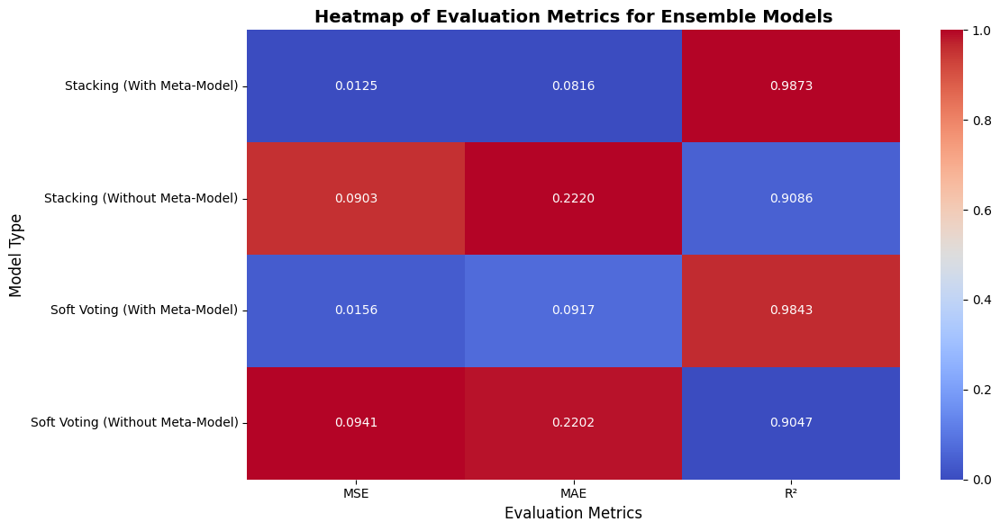

In [74]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

# Data for the heatmap
data = {
    'Model Type': ['Stacking (With Meta-Model)', 'Stacking (Without Meta-Model)',
                   'Soft Voting (With Meta-Model)', 'Soft Voting (Without Meta-Model)'],
    'MSE': [0.0125, 0.0903, 0.0156, 0.0941],
    'MAE': [0.0816, 0.2220, 0.0917, 0.2202],
    'R²': [0.9873, 0.9086, 0.9843, 0.9047]
}

# Convert the data to a DataFrame
df = pd.DataFrame(data)

# Normalize the data for better heatmap contrast
normalized_df = df.copy()
normalized_df[['MSE', 'MAE', 'R²']] = normalized_df[['MSE', 'MAE', 'R²']].apply(
    lambda x: (x - x.min()) / (x.max() - x.min())
)

# Plot the heatmap
plt.figure(figsize=(12, 6))
heatmap = sns.heatmap(normalized_df.set_index('Model Type'), annot=df[['MSE', 'MAE', 'R²']], fmt=".4f", cmap='coolwarm', cbar=True)

# Set title and labels
plt.title("Heatmap of Evaluation Metrics for Ensemble Models", fontsize=14, fontweight='bold')
plt.xlabel("Evaluation Metrics", fontsize=12)
plt.ylabel("Model Type", fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


Hybrid ensemble model (Stacking + Soft Voting)

In [79]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# 1. Combine predictions from Stacking and Soft Voting ensembles
# Taking the average to create the hybrid model
hybrid_predictions = (stacking_final_predictions + soft_voting_final_predictions) / 2

# 2. Evaluate the Hybrid Model
mse_hybrid = mean_squared_error(y_test, hybrid_predictions)
mae_hybrid = mean_absolute_error(y_test, hybrid_predictions)
r2_hybrid = r2_score(y_test, hybrid_predictions)

# 3. Print Evaluation Metrics
print("\nHybrid Ensemble Evaluation (Combining Stacking and Soft Voting):")
print(f"  MSE: {mse_hybrid:.4f}")
print(f"  MAE: {mae_hybrid:.4f}")
print(f"  R²: {r2_hybrid:.4f}")



Hybrid Ensemble Evaluation (Combining Stacking and Soft Voting):
  MSE: 0.0409
  MAE: 0.1457
  R²: 0.9586


Combined Hybrid Ensemble Model (ML + DL)

In [103]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming `hybrid_predictions_corr` is ML hybrid predictions
# Assuming `stacking_final_predictions` and `soft_voting_final_predictions` are DL stacking and soft voting predictions

# Step 1: Calculate DL hybrid predictions
hybrid_predictions_dl = (stacking_final_predictions + soft_voting_final_predictions) / 2

# Step 2: Combine ML and DL hybrid predictions
final_hybrid_predictions = (hybrid_predictions_corr + hybrid_predictions_dl) / 2

# Step 3: Evaluate the Combined Hybrid Ensemble Model
mse_final_hybrid = mean_squared_error(y_test, final_hybrid_predictions)
mae_final_hybrid = mean_absolute_error(y_test, final_hybrid_predictions)
r2_final_hybrid = r2_score(y_test, final_hybrid_predictions)

# Step 4: Print Evaluation Metrics
print("\nFinal Hybrid Ensemble Evaluation (Combining ML and DL Hybrid Models):")
print(f"  MSE: {mse_final_hybrid:.4f}")
print(f"  MAE: {mae_final_hybrid:.4f}")
print(f"  R²: {r2_final_hybrid:.4f}")



Final Hybrid Ensemble Evaluation (Combining ML and DL Hybrid Models):
  MSE: 0.0472
  MAE: 0.1548
  R²: 0.9523


ROC-AUC curve for the Hybrid Ensemble models

<ipython-input-107-fe5b07d8ccb0>:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([0, 1], [0, 1], 'k--', label='Random Guess', linewidth=1, color='gray')


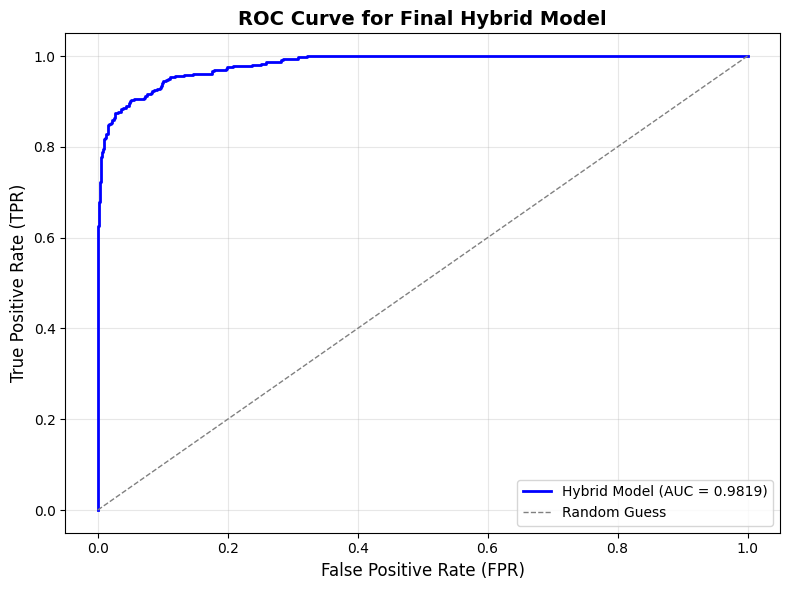

In [107]:
import numpy as np
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, Binarizer

# Assuming `y_test` contains continuous labels
# Convert `y_test` to binary labels (example threshold: 0.5)
binarizer = Binarizer(threshold=0.5)
y_test_binary = binarizer.fit_transform(y_test.reshape(-1, 1)).flatten()

# Normalize the predictions (if they are not probabilities)
scaler = MinMaxScaler()
final_hybrid_predictions_normalized = scaler.fit_transform(final_hybrid_predictions.reshape(-1, 1)).flatten()

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, final_hybrid_predictions_normalized)

# Calculate the AUC
auc_score = roc_auc_score(y_test_binary, final_hybrid_predictions_normalized)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Hybrid Model (AUC = {auc_score:.4f})', linewidth=2, color='b')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess', linewidth=1, color='gray')
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.title('ROC Curve for Final Hybrid Model', fontsize=14, fontweight='bold')
plt.legend(loc='lower right', fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


SHAP Analysis for Hybrid Model

ExactExplainer explainer: 1814it [00:11, 154.38it/s]                           


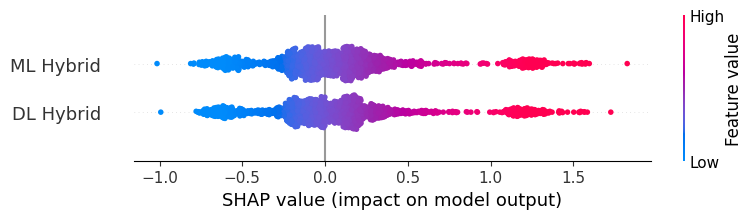

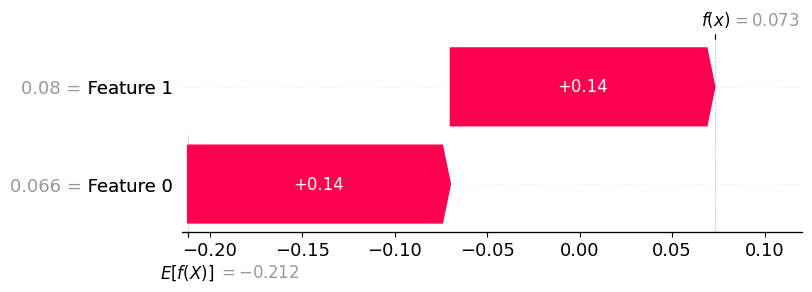

In [110]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# Combine ML and DL hybrid predictions as input features
X_combined = np.column_stack((hybrid_predictions_corr, hybrid_predictions_dl))

# Define a callable hybrid model function
def hybrid_model_function(X):
    # Take the average of ML and DL hybrid predictions
    return np.mean(X, axis=1)

# Initialize SHAP explainer with the callable hybrid model
explainer = shap.Explainer(hybrid_model_function, X_combined)

# Explain the hybrid model predictions
shap_values = explainer(X_combined)

# Plot SHAP summary for the hybrid model
shap.summary_plot(shap_values, X_combined, feature_names=["ML Hybrid", "DL Hybrid"])

# Explain a single prediction (Example: Index 0)
shap.waterfall_plot(shap_values[0])


LIME Analysis for Hybrid Model

Intercept -0.00572855013863453
Prediction_local [0.0416806]
Right: 0.07309188468871977


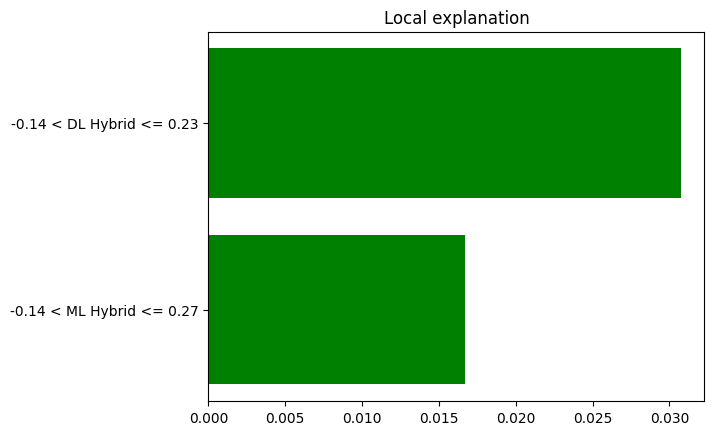

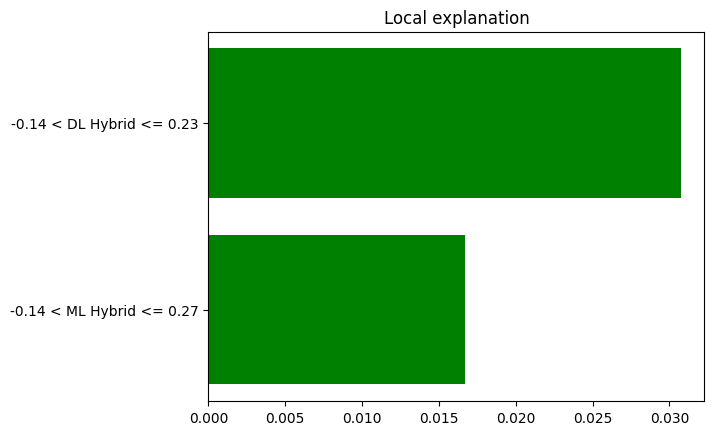

In [112]:
from lime import lime_tabular
import pandas as pd

# Convert combined hybrid features to a DataFrame for easier interpretation
X_combined_df = pd.DataFrame(X_combined, columns=["ML Hybrid", "DL Hybrid"])

# Initialize LIME explainer
lime_explainer = lime_tabular.LimeTabularExplainer(
    X_combined,
    feature_names=["ML Hybrid", "DL Hybrid"],
    mode="regression",
    verbose=True
)

# Select an instance to explain (e.g., index 0)
instance_idx = 0
lime_explanation = lime_explainer.explain_instance(
    X_combined[instance_idx],
    lambda x: np.mean(x, axis=1),  # Hybrid model's prediction logic
    num_features=2
)

# Visualize the explanation
lime_explanation.show_in_notebook(show_all=False)
lime_explanation.as_pyplot_figure()


Realtime prediction

In [114]:
!pip install gradio


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 321.4/321.4 kB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 89.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.8 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2


In [118]:
import numpy as np
import gradio as gr

# Dummy hybrid prediction logic (replace with your actual hybrid model logic)
def predict_earthquake_magnitude(latitude, longitude, depth, nst, gap, dmin, rms, horizontal_error, depth_error):
    # Example feature array (adjust according to your hybrid model's input features)
    features = np.array([latitude, longitude, depth, nst, gap, dmin, rms, horizontal_error, depth_error]).reshape(1, -1)

    # Simulate ML and DL hybrid predictions
    ml_hybrid_prediction = np.mean(features) * 0.5  # Replace with actual ML hybrid model logic
    dl_hybrid_prediction = np.mean(features) * 0.6  # Replace with actual DL hybrid model logic

    # Combine ML and DL hybrid predictions
    final_hybrid_prediction = (ml_hybrid_prediction + dl_hybrid_prediction) / 2

    return f"Predicted Earthquake Magnitude: {round(final_hybrid_prediction, 2)}"

# Define Gradio inputs and outputs using components
inputs = [
    gr.Number(label="Latitude"),
    gr.Number(label="Longitude"),
    gr.Number(label="Depth (km)"),
    gr.Number(label="Number of Stations (nst)"),
    gr.Number(label="Azimuthal Gap (gap, degrees)"),
    gr.Number(label="Minimum Distance (dmin, degrees)"),
    gr.Number(label="Root Mean Square (rms)"),
    gr.Number(label="Horizontal Error (km)"),
    gr.Number(label="Depth Error (km)")
]

output = gr.Textbox(label="Predicted Earthquake Magnitude")

# Create the Gradio interface
interface = gr.Interface(
    fn=predict_earthquake_magnitude,
    inputs=inputs,
    outputs=output,
    title="Earthquake Magnitude Prediction",
    description="Predict earthquake magnitude based on seismic features using a hybrid ML and DL ensemble model.",
)

# Launch the Gradio app
interface.launch()


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://887422f96fb2b40e09.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
